In [121]:
%run "../Retropy_framework.ipynb"

In [46]:
all_assets = [
# ==== STOCKS ====
# Global
d_ac,
# US
ac,
lc,
mc,
sc,
mcc,
lcv,
mcv,
scv,
lcg,
mcg,
scg,
# ex-US
i_ac,
i_sc,
d_ac,
i_dev,
i_acv,
i_scv,
em_ac,
em_sc,
fr_ac,

# ==== BONDS ====
# US GOVT
sgb,
tips,
lgb,
elgb,
gb,
fgb,
# US CORP 
cb,
scb,
lcb,
fcb,
# US CORP+GOVT
gcb,
sgcb,
# International
i_tips,
i_gcbUsd,
i_gbLcl,
i_gb,
i_cb,
i_cjb,
g_gcbLcl,
g_gcbUsd,
g_sgcb,
g_usgcb,
em_gbUsd,
emb,
em_gbLcl,
em_cjb,
cjb,
junk,
scjb,

# ==== CASH ====
rfr,

# ==== OTHER ====
#fedRate,
reit,
i_reit,
gold,
silver,
palladium,
platinum,
#metals,
comm,
oilWtiQ,
oilBrentQ,

]

In [47]:
#conf_cache_disk = False
#conf_cache_memory = False
conf_cache_fails = False
all_assets = get(all_assets, source="AV")

In [48]:
all = filterByStart(all_assets, 2008)
#show(all, legend=False)

dropped: i_cjb, scb, i_tips, g_usgcb, fgb, em_cjb, lcb, fcb, g_sgcb, scjb, fr_ac, em_sc


dropped: i_cjb, scb, i_tips, g_usgcb, fgb, em_cjb, lcb, fcb, g_sgcb, scjb, fr_ac, em_sc
trimmed data from 1968-01-02 [gold, silver] to 2007-01-11 [rfr]


<Figure size 864x576 with 0 Axes>

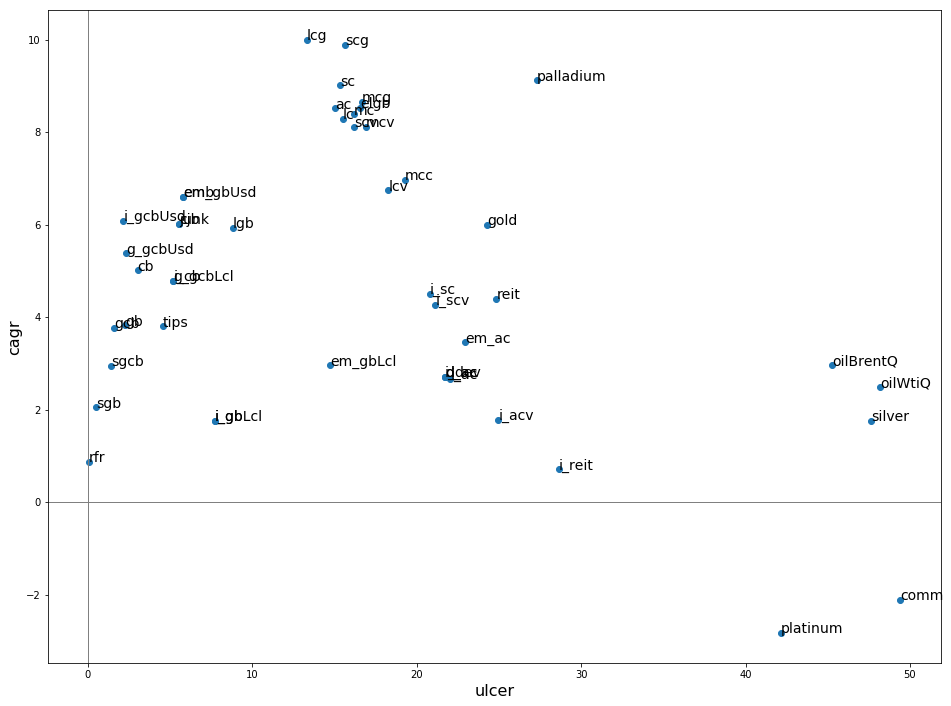

In [144]:
all = filterByStart(all_assets, 2008)
all = doTrim(all)
showRiskReturn(*all)

In [145]:
# PERM, BRK-B, GURU, ...
ser = lrret(PERM, all, fit_values=True, sum1=True, pos_weights=True, freq="M")
#ser[ser>0.01].sort_values(ascending=False)
ser[np.abs(ser)>0.01].sort_values(ascending=False)
show(rfr)

trimmed data from 2012-02-29 [PERM, PERM - fit] to 2012-02-29 [PERM, PERM - fit]


R^2: 0.9676794382588699


gold       0.1994
g_gcbUsd   0.1563
rfr        0.1319
sgb        0.1002
lgb        0.0882
em_ac      0.0852
elgb       0.0496
i_gcbUsd   0.0440
gb         0.0436
silver     0.0328
scg        0.0238
lc         0.0151
reit       0.0146
dtype: float64

trimmed data from 2007-01-11 [rfr] to 2007-01-11 [rfr]


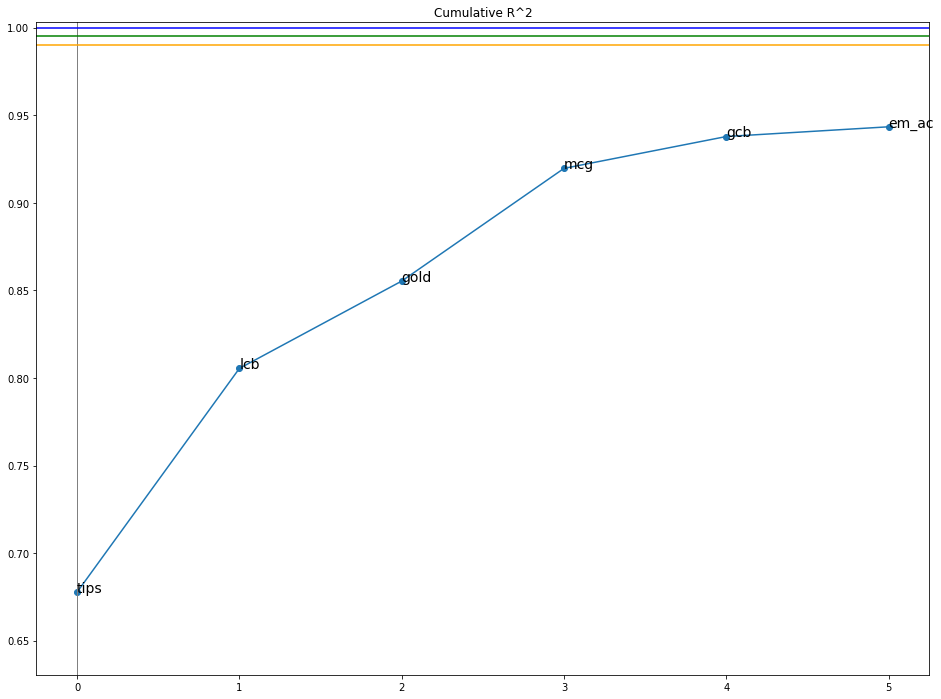

tips    0.6777
lcb     0.8054
gold    0.8553
mcg     0.9197
gcb     0.9379
em_ac   0.9434
dtype: float64

In [146]:
lrret_incremental("PERM", all_assets, max_n=6)

In [142]:
def lrret_mutual_dependence(sources, **lrret_args):
    sources = get(sources)
    res = []
    for target in sources:
        rest = sources.copy()
        rest.remove(target)
        print(f"{target.name} vs {[s.name for s in rest]}")
        rs = lrret(target, rest, return_res=True, return_ser=False, show_res=False, **lrret_args)
        res.append((rs['R^2'], target.name))

    res = pd.Series(*list(zip(*res))).fillna(method='bfill')
    res = res.sort_values()
    if show:
        show_series(res)
        #plt.axhline(, c="blue");
        plt.axhline(1/math.e, c="green");        
        plt.axhline(math.exp(0.9)/math.e, c="orange");        
        plt.ylim(ymax=1.003)
        plt.title("mutual R^2")
        plt.show()
            
    return res

def lrret_mutual_incremental(sources, base=None, show=True, show_steps=False, max_n=None, **lrret_args):
    if base is None:
        base = lc
    base = get(base)
    cum_sources = [base]
    sources = get(sources)
    sources = sources.copy()
    top = []
    while len(sources) > 0:
        if max_n and len(top) == max_n:
            break
        allres = [lrret(target, cum_sources, return_res=True, return_ser=False, show_res=False, **lrret_args) for target in sources]
        max_i = np.argmin([res["R^2"] for res in allres])
        max_res = allres[max_i]
        max_source = sources[max_i]

        top.append((max_res["R^2"], max_source.name))
        cum_sources.append(max_source)
        del sources[max_i]

    res = pd.Series(*list(zip(*top))).fillna(method='bfill')
    if show:
        #clear_output()
        #plt.figure()
        show_series(res)
        #plt.axhline(, c="blue");
        plt.axhline(1/math.e, c="green");        
        plt.axhline(math.exp(0.9)/math.e, c="orange");        
        plt.ylim(ymax=1.003)        
        plt.title("incremental R^2")
        plt.show()
            
    return res
           

Fetching XT from AV .. DONE
Fetching KWEB from AV .. DONE
Fetching ARKW from AV .. DONE
trimmed data from 1999-03-10 [QQQ] to 2015-03-24 [XT]
XT vs ['KWEB', 'QQQ', 'FDN', 'IBB', 'ARKW']
KWEB vs ['XT', 'QQQ', 'FDN', 'IBB', 'ARKW']
QQQ vs ['XT', 'KWEB', 'FDN', 'IBB', 'ARKW']
FDN vs ['XT', 'KWEB', 'QQQ', 'IBB', 'ARKW']
IBB vs ['XT', 'KWEB', 'QQQ', 'FDN', 'ARKW']
ARKW vs ['XT', 'KWEB', 'QQQ', 'FDN', 'IBB']


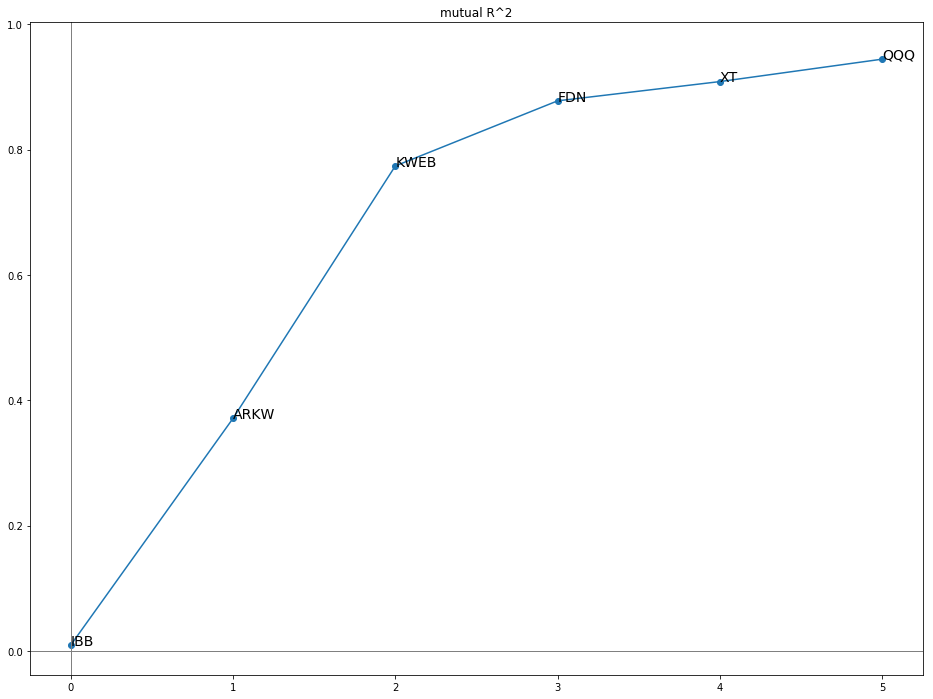

IBB    0.0094
ARKW   0.3712
KWEB   0.7741
FDN    0.8780
XT     0.9087
QQQ    0.9445
dtype: float64

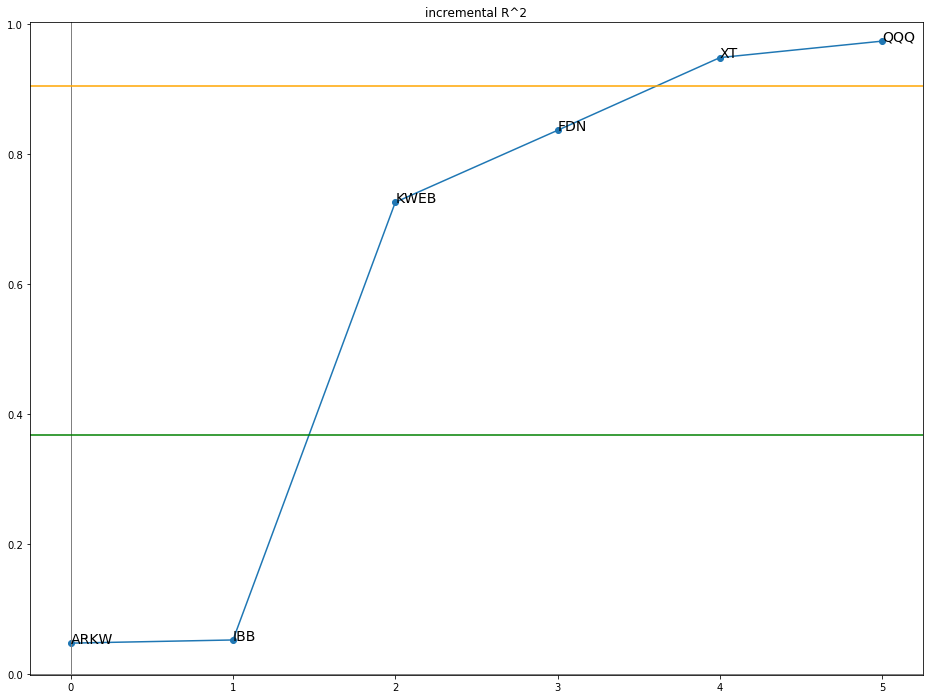

ARKW   0.0480
IBB    0.0529
KWEB   0.7264
FDN    0.8371
XT     0.9490
QQQ    0.9743
dtype: float64

In [147]:
#all = get([FPE, ANGL, EMB, EBND, gb, cb, lc, i_ac, VWO, VBR, FDN, QQQ, IBB, EDV, usdMajor], trim=True)
all = get([XT, KWEB, QQQ, FDN, IBB, ARKW], trim=True)
#lrret_mutual_dependence([ac, sc, lc, i_ac, em_ac, gb, cb, gold])
#lrret_mutual_dependence([FDN, QQQ, IBB, 'XBI', VGT])

lrret_mutual_dependence(all)
lrret_mutual_incremental(all)
#lrret_mutual_incremental([all[4], sc])
#lrret(all[4], lc, fit_values=True)

In [151]:
lrret(QQQ, [XT, KWEB, FDN, IBB, ARKW])

trimmed data from 2015-03-24 [QQQ, QQQ - fit] to 2015-03-24 [QQQ, QQQ - fit]


R^2: 0.9445011888587462


XT     0.5988
FDN    0.3481
IBB    0.0531
KWEB   0.0000
ARKW   0.0000
dtype: float64

In [148]:
show([x/QQQ for x in all])

trimmed data from 2015-03-24 [XT / QQQ, KWEB / QQQ, QQQ / QQQ, FDN / QQQ, IBB / QQQ, ARKW / QQQ] to 2015-03-24 [XT / QQQ, KWEB / QQQ, QQQ / QQQ, FDN / QQQ, IBB / QQQ, ARKW / QQQ]


reit vs ['i_reit', 'usdMajor']
i_reit vs ['reit', 'usdMajor']
usdMajor vs ['reit', 'i_reit']


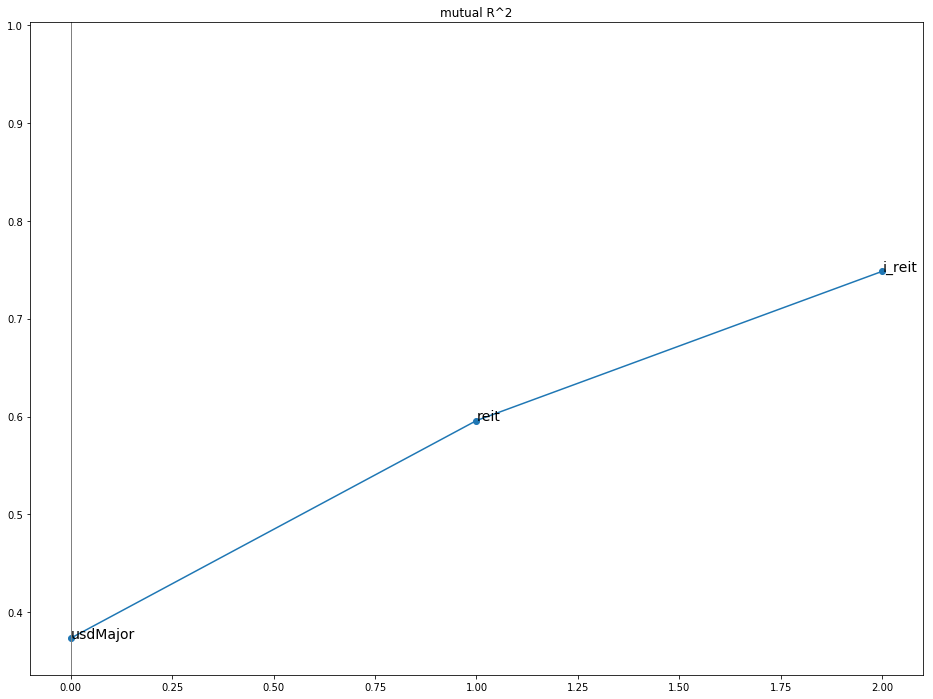

usdMajor   0.3733
reit       0.5959
i_reit     0.7485
dtype: float64

lrret: 1st attempt failed with: Positive directional derivative for linesearch
lrret: 2nd attempt (random) was better, 1st:0.15857427717793857, 2nd: 0.15862464142047794


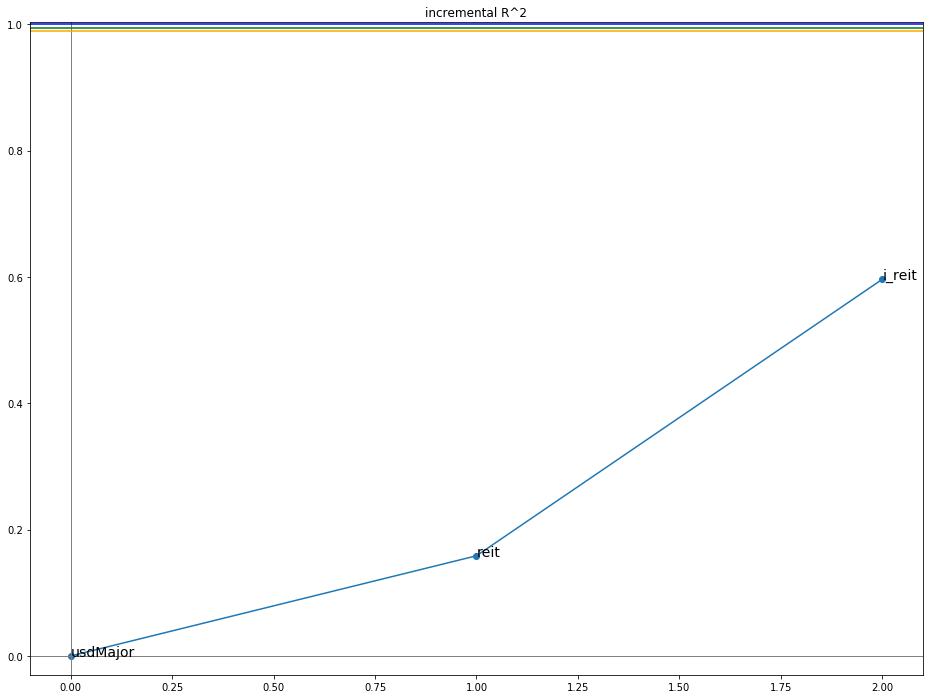

usdMajor   0.0000
reit       0.1586
i_reit     0.5964
dtype: float64

In [131]:
all = [reit, i_reit, usdMajor]
lrret_mutual_dependence(all, sum1=False, pos_weights=False)
lrret_mutual_incremental(all)

In [124]:
lrret(FPE, [gb, QQQ, EBND, EDV, IBB])

trimmed data from 2013-02-12 [FPE, FPE - fit] to 2013-02-12 [FPE, FPE - fit]


R^2: 0.43216718898695894


gb     0.4260
QQQ    0.2840
EBND   0.1663
EDV    0.1237
IBB    0.0000
dtype: float64

In [96]:
lrret(QQQ, [FDN, IBB, 'XBI', 'VGT'])

trimmed data from 2006-06-23 [QQQ, QQQ - fit] to 2006-06-23 [QQQ, QQQ - fit]


R^2: 0.9886740982246855


VGT   0.5715
FDN   0.2598
IBB   0.1687
XBI   0.0000
dtype: float64

In [40]:
conf_cache_disk = True
conf_cache_memory = True
lrret("PERM", get([i_cb, lcv, gold, gcb], source="AV"), fit_values=True, sum1=True)

Fetching i_cb from AV .. DONE
Fetching lcv from AV .. DONE
Fetching gold from Q .. DONE
Fetching gcb from AV .. DONE
Fetching PERM from AV .. DONE
trimmed data from 2012-02-08 [PERM, PERM - fit] to 2012-02-08 [PERM, PERM - fit]


R^2: 0.9172243571955851


gcb    0.5963
gold   0.2951
i_cb   0.0000
lcv    0.1086
dtype: float64

In [46]:
show_rolling_beta("PERM", get([i_cb, lcv, gold, gcb], source="AV"), freq="M")

In [73]:
show_rolling_beta("HTUS", [SPY], window=30, pvalue=False, rsq=False, extra=((HTUS/SPY)-0.11)*40)

In [56]:
show(HTUS, SPY, HTUS/SPY)

trimmed data from 1995-01-03 [SPY] to 2015-06-25 [HTUS, HTUS / SPY]


In [60]:
target = 'AAPL:20|GOOG:20|AMZN:20|MSFT:20|FB:20'
assets = [FDN, QQQ, SPY, VGT, IEI, GLD, VEA, VWO]

lrret(target, assets)


trimmed data from 2014-03-28 [AAPL:20|GOOG:20|AMZN:20|MSFT:20|FB:20, AAPL:20|GOOG:20|AMZN:20|MSFT:20|FB:20 - fit] to 2014-03-28 [AAPL:20|GOOG:20|AMZN:20|MSFT:20|FB:20, AAPL:20|GOOG:20|AMZN:20|MSFT:20|FB:20 - fit]


R^2: -0.7647009693695042


FDN   1.0000
VWO   0.0000
VGT   0.0000
VEA   0.0000
SPY   0.0000
QQQ   0.0000
IEI   0.0000
GLD   0.0000
dtype: float64